In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

import imblearn
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

import lime
import lime.lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import shap

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns',None)

# DT RF

##  data loading

In [2]:
train = pd.read_csv(r'Data/rf_train.csv')
train.head(2)

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,default.payment.next.month
0,50000.0,0,0,0,0,0,-2,46727.0,47973.0,48990.0,49261.0,0.0,0.0,2000.0,2005.0,1745.0,0.0,0.0,0.0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,32158.5,958.333333,0.93454,0.042802,0.95946,0.041794,0.97980,0.03562,0.98522,0.0,0.00000,1.0,0.00000,1.0,0,0,0,1
1,200000.0,-1,-1,-1,-1,-1,-1,780.0,0.0,390.0,390.0,390.0,390.0,0.0,390.0,390.0,390.0,390.0,390.0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,390.0,325.000000,0.00390,0.000000,0.00000,390.000000,0.00195,1.00000,0.00195,1.0,0.00195,1.0,0.00195,1.0,1,1,0,0


In [3]:
test = pd.read_csv(r'Data/rf_test.csv')
test.head(2)

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,default.payment.next.month
0,440000.0,0,0,0,0,0,0,164269.0,160608.0,150150.0,139178.0,123627.0,48175.0,5666.0,5802.0,3577.0,2955.0,12000.0,1025.0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,131001.166667,5170.833333,0.373339,0.034492,0.365018,0.036125,0.34125,0.023823,0.316314,0.021232,0.28097,0.097066,0.109489,0.021277,0,0,0,0
1,50000.0,1,2,0,0,0,0,51210.0,47140.0,48478.0,48173.0,21134.0,20403.0,0.0,3518.0,3000.0,2352.0,2000.0,2000.0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,39423.000000,2145.000000,1.024200,0.000000,0.942800,0.074629,0.96956,0.061884,0.963460,0.048824,0.42268,0.094634,0.408060,0.098025,1,0,0,0


In [4]:
X_train = train.drop(columns=['default.payment.next.month'])
y_train = train['default.payment.next.month']
X_test = test.drop(columns=['default.payment.next.month'])
y_test = test['default.payment.next.month']

## DT

In [5]:
# build pipeline - using RandomOverSampling to oversample
rs=7
sscaler = StandardScaler()
ros = RandomOverSampler(random_state=rs)
dt = DecisionTreeClassifier(random_state=rs)

pipe_ros = make_pipeline(sscaler, ros, dt)
pipe_ros

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomoversampler', RandomOverSampler(random_state=7)),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(random_state=7))])

In [6]:
# set parameters for GridSearch tunning
dt_params = {
    'decisiontreeclassifier__criterion': ['gini','entropy'],
    'decisiontreeclassifier__max_depth': [3,4,5,6,7,8] 
}

In [7]:
grid = GridSearchCV(pipe_ros, dt_params, scoring='f1_macro')
grid.fit(X_train, y_train)

print(grid.best_params_)
print(grid.best_score_)

y_pred = grid.best_estimator_.predict(X_test)
print(f1_score(y_test, y_pred))
print('roc_auc_score', roc_auc_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

{'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 8}
0.7319089516553341
0.5078192875760209
roc_auc_score 0.6905606546336815
              precision    recall  f1-score   support

           0       0.87      0.79      0.83      7009
           1       0.45      0.59      0.51      1991

    accuracy                           0.75      9000
   macro avg       0.66      0.69      0.67      9000
weighted avg       0.78      0.75      0.76      9000



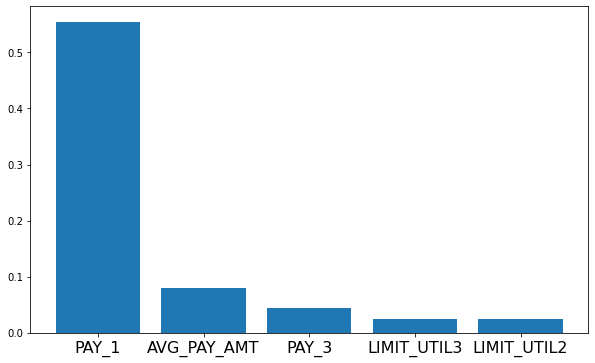

In [8]:
# get importance
importance = grid.best_estimator_.steps[2][1].feature_importances_

# identify the top 20 important features for Decision tree model
max_inx = (-importance).argsort()[:5]
feature_top5 = X_test.columns[max_inx]

# plot feature importance - top 20
plt.figure(figsize=(10, 6))
plt.bar(feature_top5, importance[max_inx])
plt.xticks(fontsize=16)
plt.show()

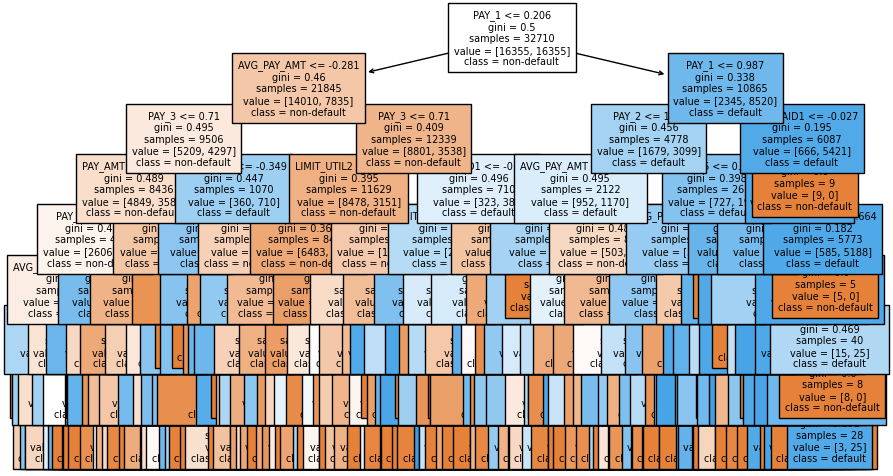

In [9]:
from sklearn import tree
fn= X_test.columns
cn=['non-default', 'default']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,6), dpi=100)
# fig = plt.figure(figsize=(20,12))
tree.plot_tree(grid.best_estimator_.steps[2][1],
               feature_names = fn, 
               class_names=cn,
               fontsize=7,
               filled = True);

## RF

In [5]:
import joblib
model = joblib.load('rf.sav')
model

Pipeline(steps=[('scaler', StandardScaler()),
                ('rf',
                 RandomForestClassifier(criterion='entropy', max_depth=8,
                                        min_samples_split=4, random_state=7))])

### ELI5

In [15]:
# feature weight with Eli5
import eli5
eli5.show_weights(model.steps[1][1], feature_names=X_test.columns.tolist())

Weight,Feature
0.2262 ± 0.2965,PAY_1
0.1131 ± 0.2591,PAY_2
0.0660 ± 0.1958,PAY_3
0.0518 ± 0.1603,PAY_4
0.0437 ± 0.1476,PAY_5
0.0372 ± 0.0721,AVG_PAY_AMT
0.0278 ± 0.0521,PAY_AMT2
0.0261 ± 0.0540,PAY_AMT1
0.0248 ± 0.1063,PAY_6
0.0248 ± 0.0547,LIMIT_BAL


### RF - LIME - local

In [16]:
predict_fn_rf = lambda x: model.predict_proba(x).astype(float)
X = X_test.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_test.columns.tolist(), mode='classification',
                                                   class_names=['Non-default','Default'],kernel_width=5)

In [40]:
from tqdm import tqdm

r_sqr = []

for i in tqdm(range(1000), position=0):
    choosen_instance = X_test.loc[[i]].values[0]
    exp = explainer.explain_instance(choosen_instance, predict_fn_rf, num_features=7)
    r_sqr.append(exp.score)

  3%|██▎                                                                           | 30/1000 [06:40<3:35:34, 13.33s/it]


KeyboardInterrupt: 

In [7]:
X_test_r2_1000 = pd.read_csv('X_test_r2.csv')
test_r2 = pd.concat([X_test_r2_1000, y_test[:1000]], axis=1)
test_r2["r2"] = pd.to_numeric(test_r2.r2, errors='coerce')
test_r2.head(2)

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,r2,default.payment.next.month
0,440000.0,0,0,0,0,0,0,164269.0,160608.0,150150.0,139178.0,123627.0,48175.0,5666.0,5802.0,3577.0,2955.0,12000.0,1025.0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,131001.166667,5170.833333,0.373339,0.034492,0.365018,0.036125,0.34125,0.023823,0.316314,0.021232,0.28097,0.097066,0.109489,0.021277,0,0,0,0.184583,0
1,50000.0,1,2,0,0,0,0,51210.0,47140.0,48478.0,48173.0,21134.0,20403.0,0.0,3518.0,3000.0,2352.0,2000.0,2000.0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,39423.000000,2145.000000,1.024200,0.000000,0.942800,0.074629,0.96956,0.061884,0.963460,0.048824,0.42268,0.094634,0.408060,0.098025,1,0,0,0.525620,0


In [8]:
y_pred = model.predict(X_test)
y_pred_1000 = y_pred[:1000]
test_r2['pred'] = y_pred_1000
test_r2['pred_acc'] = test_r2['pred']+test_r2['default.payment.next.month']
test_r2['pred_acc'] = test_r2['pred_acc'].replace({2:0})
test_r2.head(2)

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,r2,default.payment.next.month,pred,pred_acc
0,440000.0,0,0,0,0,0,0,164269.0,160608.0,150150.0,139178.0,123627.0,48175.0,5666.0,5802.0,3577.0,2955.0,12000.0,1025.0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,131001.166667,5170.833333,0.373339,0.034492,0.365018,0.036125,0.34125,0.023823,0.316314,0.021232,0.28097,0.097066,0.109489,0.021277,0,0,0,0.184583,0,0,0
1,50000.0,1,2,0,0,0,0,51210.0,47140.0,48478.0,48173.0,21134.0,20403.0,0.0,3518.0,3000.0,2352.0,2000.0,2000.0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,39423.000000,2145.000000,1.024200,0.000000,0.942800,0.074629,0.96956,0.061884,0.963460,0.048824,0.42268,0.094634,0.408060,0.098025,1,0,0,0.525620,0,1,1


In [9]:
len(test_r2[test_r2['r2'] < 0.4]) / len(test_r2)

0.748

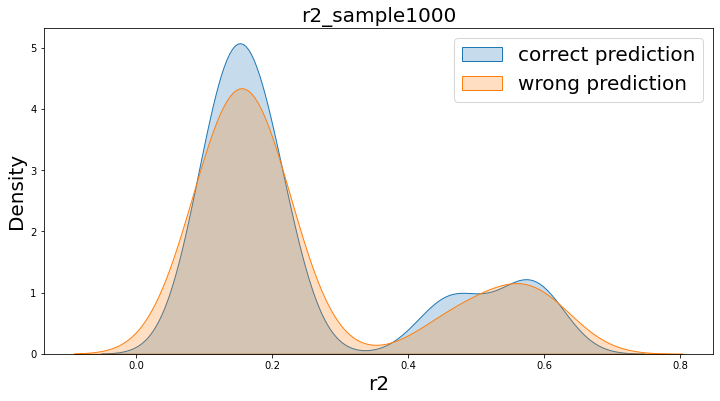

In [10]:
plt.figure(figsize = (12, 6))
s1=sns.kdeplot(test_r2.loc[test_r2['pred_acc'] == 0, 'r2'], label = 'correct prediction', shade = True)
s2=sns.kdeplot(test_r2.loc[test_r2['pred_acc'] == 1, 'r2'], label = 'wrong prediction', shade = True)

plt.xlabel('r2', fontsize=20); plt.ylabel('Density', fontsize=20)
# s1.set_xticklabels(s1.get_xticks(), size = 15)

plt.title('r2_sample1000', fontsize=20)
plt.legend(frameon=True, fontsize=20)

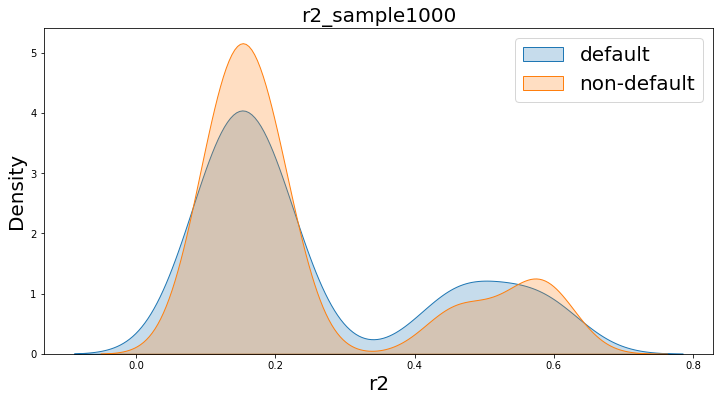

In [11]:
plt.figure(figsize = (12, 6))
s1=sns.kdeplot(test_r2.loc[test_r2['default.payment.next.month'] == 1, 'r2'], label = 'default', shade = True)
s2=sns.kdeplot(test_r2.loc[test_r2['default.payment.next.month'] == 0, 'r2'], label = 'non-default', shade = True)

plt.xlabel('r2', fontsize=20); plt.ylabel('Density', fontsize=20)
# s1.set_xticklabels(s1.get_xticks(), size = 15)

plt.title('r2_sample1000', fontsize=20)
plt.legend(frameon=True, fontsize=20)

Text(0.5, 1.0, 'r2_sample1000')

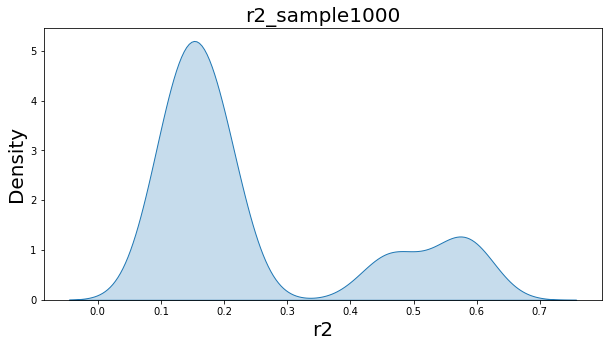

In [12]:
plt.figure(figsize = (10, 5))
sns.kdeplot(test_r2['r2'], label = 'non-default', shade = True)
plt.xlabel('r2', fontsize=20); plt.ylabel('Density', fontsize=20)
plt.title('r2_sample1000', fontsize=20)

In [10]:
print('min r2 index {}, r2={}'.format(test_r2['r2'].idxmin(), test_r2['r2'][test_r2['r2'].idxmin()]))
print('max r2 index {}, r2={}'.format(test_r2['r2'].idxmax(), test_r2['r2'][test_r2['r2'].idxmax()]))

min r2 index 448, r2=0.0815658359742224
max r2 index 130, r2=0.6303568906702357


In [34]:
test_r2[test_r2['pred_acc']==1].nsmallest(5, 'r2')

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,r2,default.payment.next.month,pred,pred_acc
869,40000.0,0,0,2,0,0,2,20528.0,22973.0,22317.0,24047.0,26644.0,26079.0,3100.0,0.0,2100.0,3000.0,0.0,3000.0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,23764.666667,1866.666667,0.51320,0.151013,0.574325,0.000000,0.557925,0.094099,0.601175,0.124756,0.666100,0.000000,0.651975,0.115035,0,0,0,0.081566,0,1,1
830,20000.0,0,0,0,0,2,2,13621.0,14984.0,16431.0,18835.0,18235.0,19535.0,1596.0,2000.0,3000.0,0.0,1600.0,0.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,16940.166667,1366.000000,0.68105,0.117172,0.749200,0.133476,0.821550,0.182582,0.941750,0.000000,0.911750,0.087743,0.976750,0.000000,0,0,0,0.083792,0,1,1
764,100000.0,2,0,0,0,0,0,96547.0,97120.0,95375.0,54612.0,30306.0,60897.0,5305.0,3590.0,1118.0,720.0,50000.0,4200.0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,72476.166667,10822.166667,0.96547,0.054947,0.971200,0.036965,0.953750,0.011722,0.546120,0.013184,0.303060,1.649838,0.608970,0.068969,1,1,0,0.086651,0,1,1
336,30000.0,1,2,2,2,0,0,29334.0,28198.0,29497.0,28268.0,30817.0,17219.0,0.0,2457.0,0.0,3000.0,344.0,0.0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,27222.166667,966.833333,0.97780,0.000000,0.939933,0.087134,0.983233,0.000000,0.942267,0.106127,1.027233,0.011163,0.573967,0.000000,1,1,0,0.086807,0,1,1
377,50000.0,1,-2,-2,-2,-2,-2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0.000000,0.000000,0.00000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0,0,0,0.087694,0,1,1


In [35]:
test_r2[test_r2['pred_acc']!=1].nlargest(5, 'r2')

,LIMIT_BAL,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,SEX_1,SEX_2,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,BINNED_AGE_21-25,BINNED_AGE_25-28,BINNED_AGE_28-30,BINNED_AGE_30-32,BINNED_AGE_32-35,BINNED_AGE_35-39,BINNED_AGE_39-42,BINNED_AGE_42-48,BINNED_AGE_48-79,AVG_BILL_AMT,AVG_PAY_AMT,LIMIT_UTIL1,PERC_PAID1,LIMIT_UTIL2,PERC_PAID2,LIMIT_UTIL3,PERC_PAID3,LIMIT_UTIL4,PERC_PAID4,LIMIT_UTIL5,PERC_PAID5,LIMIT_UTIL6,PERC_PAID6,EXCEEDED_LIMIT,OVERPAID,NEG_BILL,r2,default.payment.next.month,pred,pred_acc
860,90000.0,0,0,-2,-2,-2,-2,70182.0,-18.0,-18.0,-18.0,-18.0,-18.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,11682.000000,0.000000,0.779800,0.000000,-0.000200,1.000000,-0.000200,1.000000,-0.000200,1.000000,-0.000200,1.000000,-0.000200,1.000000,0,0,1,0.613625,0,0,0
557,180000.0,0,0,-2,-2,-2,-2,184650.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,30775.000000,0.000000,1.025833,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,0,0,0.610156,0,0,0
978,60000.0,-1,-1,-2,-2,-2,-1,2970.0,430.0,430.0,717.0,430.0,4171.0,430.0,430.0,717.0,430.0,4171.0,2914.0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1524.666667,1515.333333,0.049500,0.144781,0.007167,1.000000,0.007167,1.667442,0.011950,0.599721,0.007167,9.700000,0.069517,0.698633,1,1,0,0.610156,0,0,0
369,180000.0,0,0,0,0,0,0,154374.0,153018.0,146396.0,136531.0,138502.0,136665.0,7500.0,7000.0,5000.0,5000.0,6000.0,5137.0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,144247.666667,5939.500000,0.857633,0.048583,0.850100,0.045746,0.813311,0.034154,0.758506,0.036622,0.769456,0.043321,0.759250,0.037588,0,0,0,0.609046,0,0,0
790,150000.0,-1,-1,-1,0,0,-1,9240.0,386.0,12870.0,11173.0,1719.0,413.0,386.0,12884.0,251.0,39.0,414.0,6556.0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,5966.833333,3421.666667,0.061600,0.041775,0.002573,33.378238,0.085800,0.019503,0.074487,0.003491,0.011460,0.240838,0.002753,15.874092,1,1,0,0.609046,0,0,0


In [42]:
# bad r2 but right prediction example
print('global predicted probability', model.predict_proba(X_test.loc[[24]]))
print('actual status ', y_test.loc[[24]]) 

choosen_instance = X_test.loc[[24]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.18238084 0.81761916]]
actual status  24    0
Name: default.payment.next.month, dtype: int64
r2= 0.6271492210057292


In [43]:
# good r2 but wrong prediction example
print('global predicted probability', model.predict_proba(X_test.loc[[26]]))
print('actual status ', y_test.loc[[26]]) 

choosen_instance = X_test.loc[[26]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.71547543 0.28452457]]
actual status  26    0
Name: default.payment.next.month, dtype: int64
r2= 0.0925142609560794


### RF- SHAP - local

In [44]:
#local interpretability
explainer = shap.TreeExplainer(model.steps[1][1])

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_scaled[24].reshape(1,-1))
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test_scaled[24], feature_names=X_test.columns)

In [54]:
#local interpretability
explainer = shap.TreeExplainer(model.steps[1][1])

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_scaled[26].reshape(1,-1))
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test_scaled[24], feature_names=X_test.columns)

# LR

## data loading

In [20]:
lr_train = pd.read_csv(r'Data/lr_train.csv')
lr_test = pd.read_csv(r'Data/lr_train.csv')

X_train_lr = lr_train.drop(columns=['default.payment.next.month'])
y_train_lr = lr_train['default.payment.next.month']
X_test_lr = lr_test.drop(columns=['default.payment.next.month'])
y_test_lr = lr_test['default.payment.next.month']

## LR-LIME

In [22]:
import joblib
lr = joblib.load('logreg.sav')
lr

Pipeline(steps=[('scaler', StandardScaler()),
                ('lr', LogisticRegression(random_state=42))])

In [46]:
predict_fn_lr = lambda x: lr.predict_proba(x).astype(float)
X = X_test.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_test.columns.tolist(), mode='classification',
                                                   class_names=['Non-default','Default'],kernel_width=5)

In [47]:
# bad r2 but right prediction example
print('global predicted probability', lr.predict_proba(X_test.loc[[24]]))
print('actual status ', y_test.loc[[24]]) 

choosen_instance = X_test.loc[[24]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_lr, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.13124373 0.86875627]]
actual status  24    0
Name: default.payment.next.month, dtype: int64
r2= 0.40774801392470206


In [48]:
# bad r2 but right prediction example
print('global predicted probability', lr.predict_proba(X_test.loc[[26]]))
print('actual status ', y_test.loc[[26]]) 

choosen_instance = X_test.loc[[26]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_lr, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.69684946 0.30315054]]
actual status  26    0
Name: default.payment.next.month, dtype: int64
r2= 0.29339132106953814


## LR-SHAP

In [65]:
#local interpretability
explainer = shap.KernelExplainer(lr.steps[1][1].predict_proba, X_test)
# explainer = shap.KernelExplainer(svm.predict_proba, X_train, link="logit")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_scaled[24])
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test_scaled[24], feature_names=X_test.columns)

Using 9000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [66]:
#local interpretability
explainer = shap.KernelExplainer(lr.steps[1][1].predict_proba, X_test)
# explainer = shap.KernelExplainer(svm.predict_proba, X_train, link="logit")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_scaled[26])
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test_scaled[24], feature_names=X_test.columns)

Using 9000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


# XGB

In [49]:
xgb_train = pd.read_csv('xgb_train.csv')
xgb_test = pd.read_csv('xgb_train.csv')

X_train_xgb = xgb_train.drop(columns=['default.payment.next.month'])
y_train_xgb = xgb_train['default.payment.next.month']
X_test_xgb = xgb_test.drop(columns=['default.payment.next.month'])
y_test_xgb = xgb_test['default.payment.next.month']

In [50]:
import joblib
xgb = joblib.load('xgb.sav')
xgb

Pipeline(steps=[('scaler', StandardScaler()),
                ('xgb',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=2.212626851837828,
                               gpu_id=-1, importance_type='gain',
                               interaction_constraints='',
                               learning_rate=0.022713751443330703,
                               max_delta_step=0, max_depth=8,
                               min_child_weight=1,
                               min_child_weights=1.8717298505312536,
                               missing=nan, monotone_constraints='()',
                               n_estimators=500, n_jobs=16, num_parallel_tree=1,
                               random_state=0, reg_alpha=0.0190204198581071,
                               reg_lambda=0.0927534352370206,
                               scale_pos_weight=1, s

In [51]:
predict_fn_xgb = lambda x: xgb.predict_proba(x).astype(float)
X = X_test.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_test.columns.tolist(), mode='classification',
                                                   class_names=['Non-default','Default'],kernel_width=5)

In [52]:
# bad r2 but right prediction example
print('global predicted probability', xgb.predict_proba(X_test.loc[[24]]))
print('actual status ', y_test.loc[[24]]) 

choosen_instance = X_test.loc[[24]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_lr, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.48931038 0.5106896 ]]
actual status  24    0
Name: default.payment.next.month, dtype: int64
r2= 0.4135498869577797


In [53]:
# bad r2 but right prediction example
print('global predicted probability', xgb.predict_proba(X_test.loc[[26]]))
print('actual status ', y_test.loc[[26]]) 

choosen_instance = X_test.loc[[26]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_lr, num_features=10)
print('r2=', exp.score)
exp.show_in_notebook(show_all=False)

global predicted probability [[0.89475036 0.10524964]]
actual status  26    0
Name: default.payment.next.month, dtype: int64
r2= 0.268536547609303
